# <div align = "center"> Cassava Leaf Image Analysis for Disease Identification and Classification </div>

### Problem Statement
To build an image classifier using a deep learning algorithm to classify cassava images into four disease categories or a fifth category indicating a healthy leaf. With this, farmers will be able to quickly identify diseased plants by taking images of their crops with mobile-quality cameras to quickly identify diseased plants, potentially saving their crops before they inflict irreparable damage.

In [1]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="0"
import numpy as np
import pandas as pd
import cv2
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.utils import class_weight

import json
import math
from datetime import datetime

from sklearn.metrics import accuracy_score, roc_auc_score, classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split, StratifiedKFold

import tensorflow as tf
# import tensorflow.compat.v1 as tf
# tf.disable_v2_behavior()
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models, callbacks, optimizers, applications, experimental, losses, utils 

# import keras
# from keras.layers import Input#, Dropout, Dense, MaxPooling2D, ZeroPadding2D, Conv2D, Flatten

import warnings
warnings.simplefilter("ignore")
import absl.logging
absl.logging.set_verbosity(absl.logging.ERROR)

In [2]:
os.listdir('../cassava-leaf-disease-classification')

['label_num_to_disease_map.json',
 'masked_images',
 'sample_submission.csv',
 'test_images',
 'test_tfrecords',
 'train.csv',
 'train_images',
 'train_tfrecords']

In [3]:
print("There are", len(os.listdir('../cassava-leaf-disease-classification/train_images')), "images in this dataset")

There are 21397 images in this dataset


In [4]:
with open('../cassava-leaf-disease-classification/label_num_to_disease_map.json') as file:
    disease_class = json.loads(file.read())
    print(json.dumps(disease_class, indent=2))

{
  "0": "Cassava Bacterial Blight (CBB)",
  "1": "Cassava Brown Streak Disease (CBSD)",
  "2": "Cassava Green Mottle (CGM)",
  "3": "Cassava Mosaic Disease (CMD)",
  "4": "Healthy"
}


In [5]:
df_train = pd.read_csv('../cassava-leaf-disease-classification/train.csv')
df_train.head()

,image_id,label
0,1000015157.jpg,0
1,1000201771.jpg,3
2,100042118.jpg,1
3,1000723321.jpg,1
4,1000812911.jpg,3


In [6]:
# Including the class names in the data
df_train['class'] = df_train['label'].map({int(i) : c for i, c in disease_class.items()}) 
df_train.head()

,image_id,label,class
0,1000015157.jpg,0,Cassava Bacterial Blight (CBB)
1,1000201771.jpg,3,Cassava Mosaic Disease (CMD)
2,100042118.jpg,1,Cassava Brown Streak Disease (CBSD)
3,1000723321.jpg,1,Cassava Brown Streak Disease (CBSD)
4,1000812911.jpg,3,Cassava Mosaic Disease (CMD)


In [7]:
df_train['class'].value_counts().to_frame().reset_index()

,index,class
0,Cassava Mosaic Disease (CMD),13158
1,Healthy,2577
2,Cassava Green Mottle (CGM),2386
3,Cassava Brown Streak Disease (CBSD),2189
4,Cassava Bacterial Blight (CBB),1087


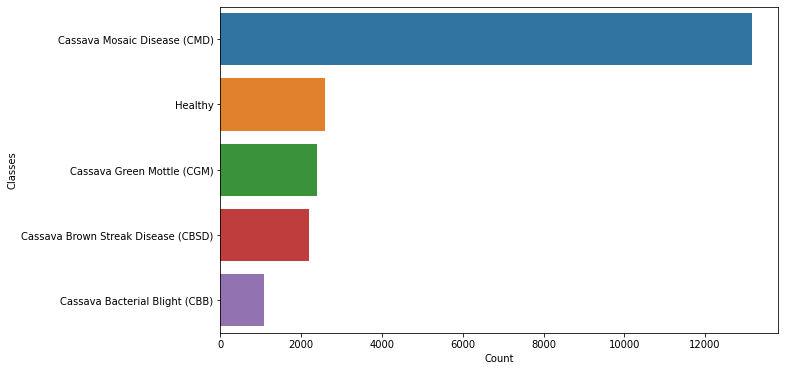

In [8]:
plt.figure(figsize=(10, 6))

sns.barplot(x='class', y='index', data=df_train['class'].value_counts().to_frame().reset_index())
plt.xlabel('Count')
plt.ylabel('Classes')
plt.show()

In [9]:
np.round((df_train['class'].value_counts() / len(df_train['class'])) * 100, 2)

Cassava Mosaic Disease (CMD)           61.49
Healthy                                12.04
Cassava Green Mottle (CGM)             11.15
Cassava Brown Streak Disease (CBSD)    10.23
Cassava Bacterial Blight (CBB)          5.08
Name: class, dtype: float64

We see that there is a heavy class imbalance in the dataset with class 3 (Cassava Mosaic Disease (CMD)) have]ing 61% of the dataset while class 0  (Cassava Bacterial Blight (CBB)) has only 5% of the dataset.

We should explore ways to balance this dataset

## Exploratory Data Analysis

In [10]:
path = "../cassava-leaf-disease-classification"

In [11]:
def plot(images, labels, predictions = None):
    n_cols = min(3, len(images))
    n_rows = math.ceil(len(images) / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols, figsize = (21,16))

    if predictions is None:
              
        predictions = [None] * len(labels)


    for i, (x, y_true, y_pred) in enumerate(zip(images, labels, predictions)):
        
        ax = axes.flat[i]
        a = plt.imread(os.path.join(path,"train_images", x ))
        ax.imshow(a)

        
        ax.set_title(f"Class: {y_true}")
             
        if y_pred is not None:
            ax.set_xlabel(f"Pred: {y_pred}", color='blue', fontweight='bold')

        ax.set_xticks([])
        ax.set_yticks([])

### Samples of "0": "Cassava Bacterial Blight (CBB)"

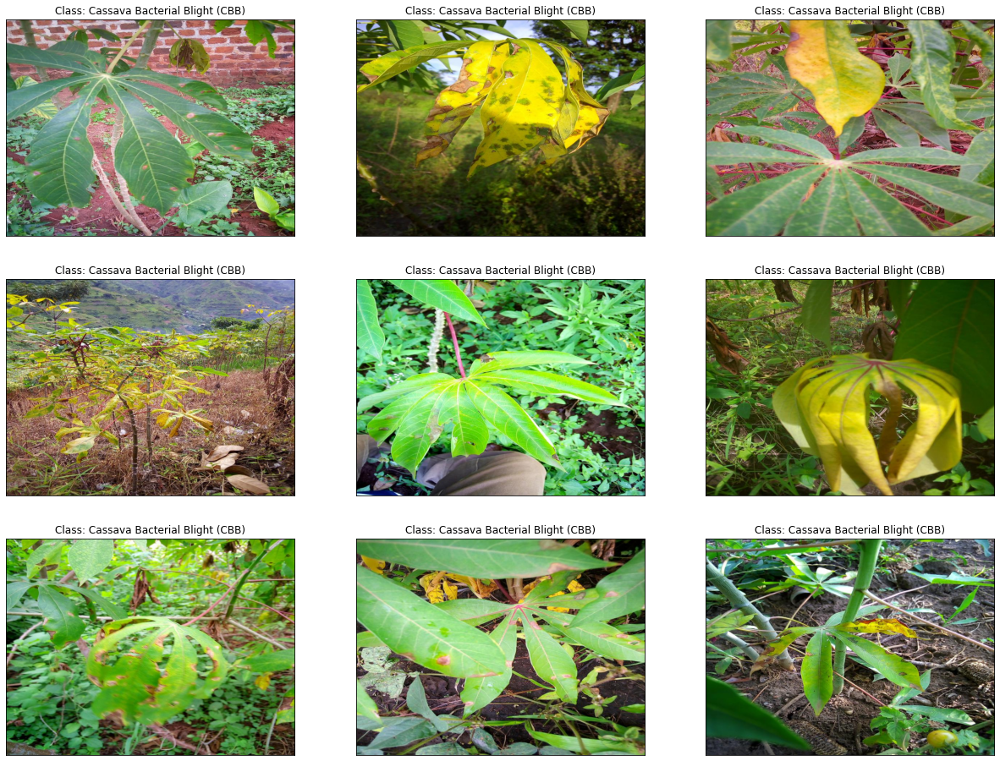

In [12]:
df_0 = df_train[df_train['label']==0]
df_0 = df_0.sample(9)
df_0_id = df_0['image_id'].values
df_0_class = df_0['class'].values

plot(df_0_id, df_0_class)

### Samples of "1": "Cassava Brown Streak Disease (CBSD)"

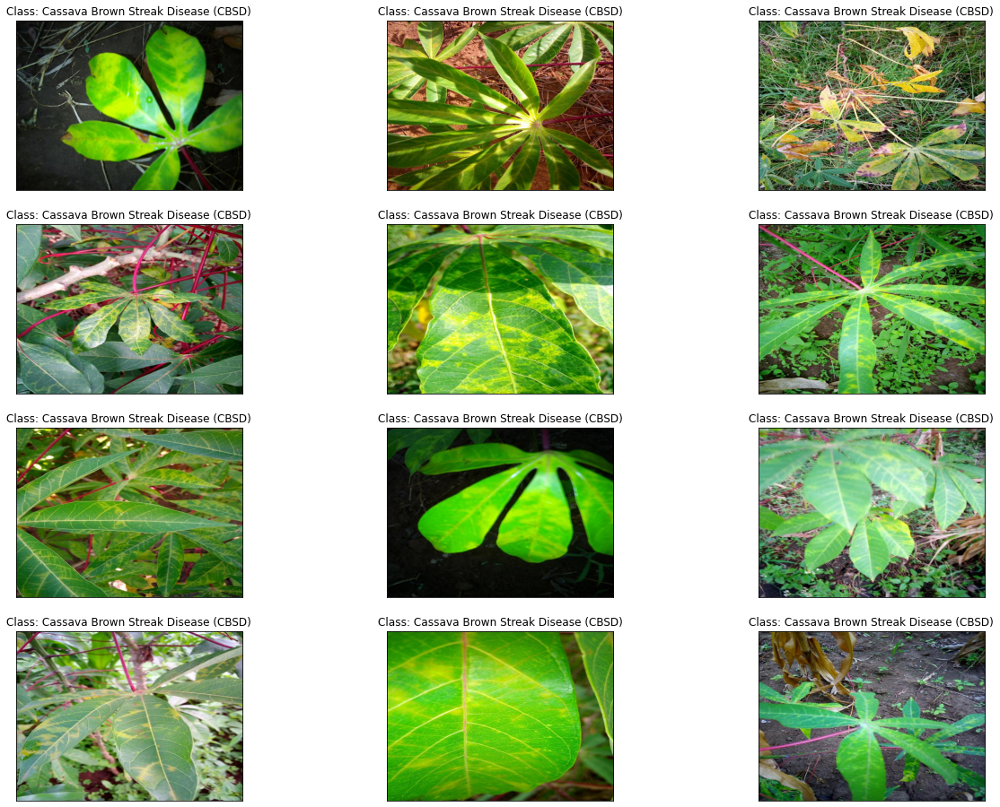

In [13]:
df_1 = df_train[df_train['label']==1]
df_1 = df_1.sample(12)
df_1_id = df_1['image_id'].values
df_1_class = df_1['class'].values

plot(df_1_id, df_1_class)

### Samples of "2": "Cassava Green Mottle (CGM)"

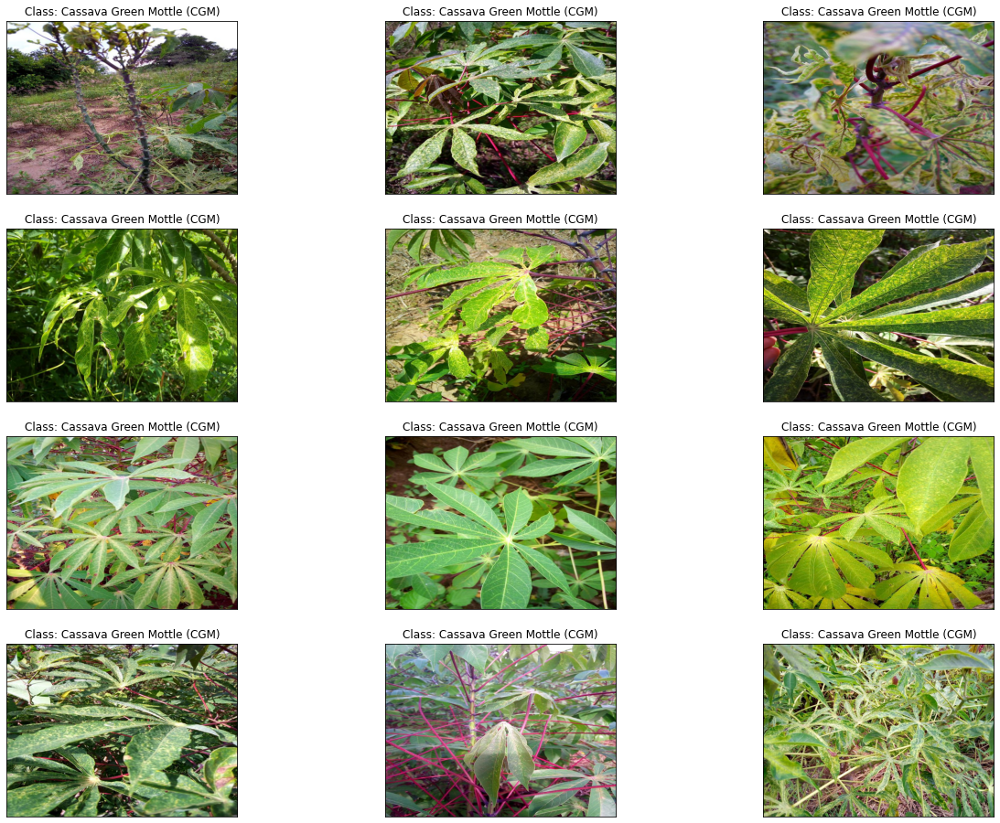

In [14]:
df_2 = df_train[df_train['label']==2]
df_2 = df_2.sample(12)
df_2_id = df_2['image_id'].values
df_2_class = df_2['class'].values

plot(df_2_id, df_2_class)

### Samples of   "3": "Cassava Mosaic Disease (CMD)"

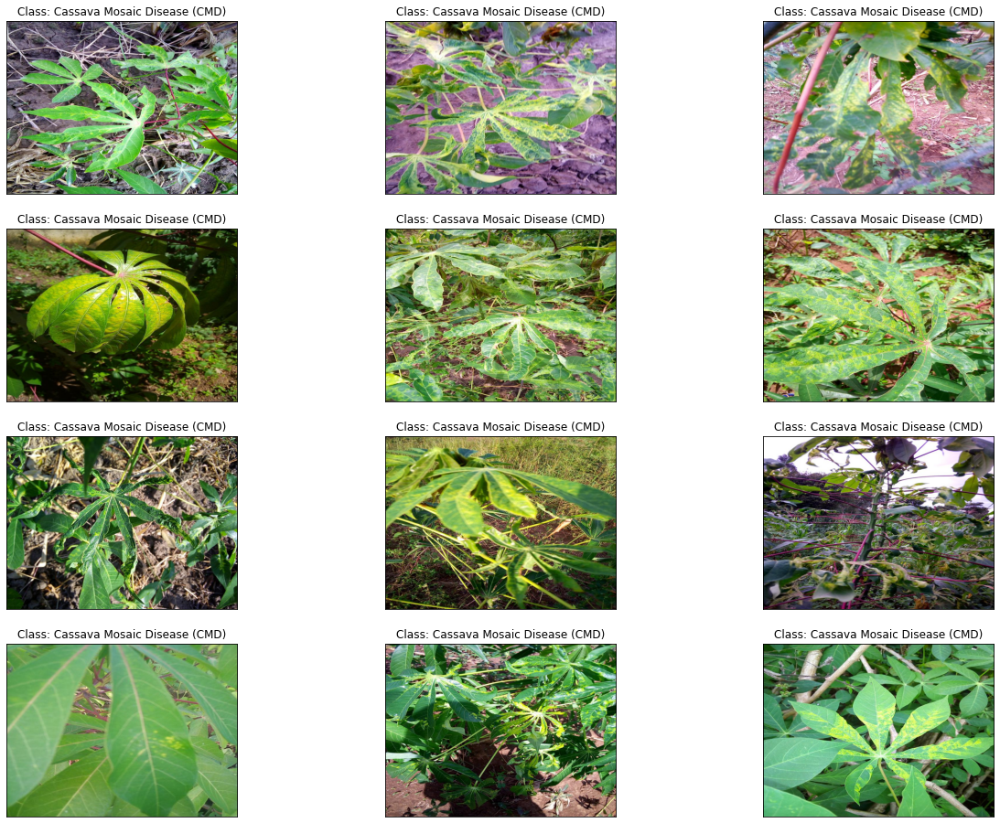

In [15]:
df_3 = df_train[df_train['label']==3]
df_3 = df_3.sample(12)
df_3_id = df_3['image_id'].values
df_3_class = df_3['class'].values

plot(df_3_id, df_3_class)

### Samples of "4": "Healthy"

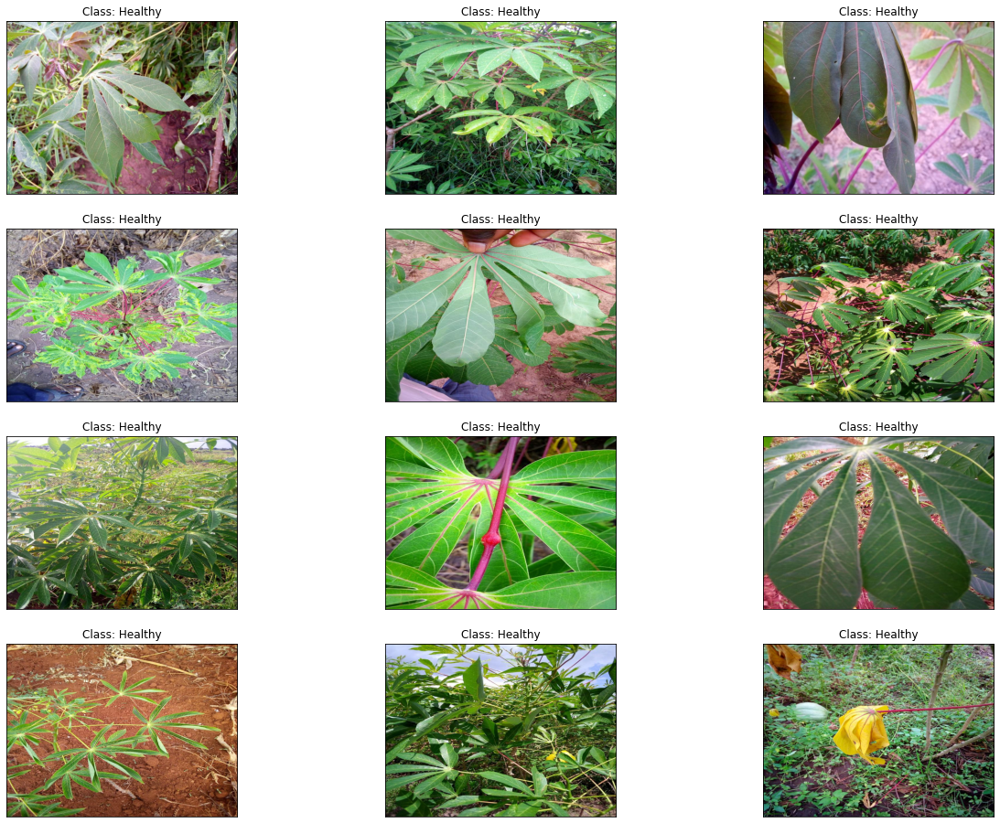

In [16]:
df_4 = df_train[df_train['label']==4]
df_4 = df_4.sample(12)
df_4_id = df_4['image_id'].values
df_4_class = df_4['class'].values

plot(df_4_id, df_4_class)

## Baseline Accuracy with Data Imbalance

In [17]:
y_pred = [3] * len(df_train.label)
print("The baseline accuracy is {}".format(accuracy_score(y_pred, df_train.label)))

The baseline accuracy is 0.6149460204701593


The default accuracy is 61% since label "3" represents 61% of the entire data, if we predict that all the leaves are in label "3", we get an accuracy of 61%.

## Handling Class Imbalance Using KFold Validation and ImageDataGenerator

In [18]:
def create_folds(df_train, n_split):
    df_train.loc[:, "kfold"] = -1
    df_train = df_train.sample(frac=1).reset_index(drop=True)
    SS = StratifiedKFold(n_splits=n_split)
    y = df_train.label.values
    for fold, (t_,v_) in enumerate((SS.split(X=df_train,y=y))):
        df_train.loc[v_, "kfold"] = fold
    return df_train

In [19]:
df_train['label'] = df_train['label'].astype('str')

In [20]:
df_train = create_folds(df_train, 5)
df_train.head(5)

,image_id,label,class,kfold
0,1765114818.jpg,2,Cassava Green Mottle (CGM),0
1,982829407.jpg,1,Cassava Brown Streak Disease (CBSD),0
2,730431773.jpg,1,Cassava Brown Streak Disease (CBSD),0
3,2807412480.jpg,1,Cassava Brown Streak Disease (CBSD),0
4,3899993787.jpg,2,Cassava Green Mottle (CGM),0


In [21]:
df_train['kfold'].value_counts()

0    4280
1    4280
2    4279
3    4279
4    4279
Name: kfold, dtype: int64

## Apply Data Transforms and Specify Data Loaders

In [22]:
train_dir = '../cassava-leaf-disease-classification/train_images'

def data_generator(train, validation , batch_size, img_rows, img_cols):
        
        train_datagen = ImageDataGenerator(rescale=1./225,
                           rotation_range=40,
                           width_shift_range=0.2,
                           height_shift_range=0.2,
                           shear_range=0.2,
                           zoom_range=0.2,
                           horizontal_flip=True,)
        
        validation_datagen = ImageDataGenerator(rescale=1./255,)
        
        train_gen = train_datagen.flow_from_dataframe(train,
                                                    train_dir,
                                                    x_col = 'image_id',
                                                    y_col = 'label',
                                                    target_size=(img_rows, img_cols),
                                                    seed = 42,
                                                    batch_size=batch_size,
                                                    class_mode='categorical',
                                                    interpolation = 'nearest',
                                                    shuffle=True)

        validation_gen = validation_datagen.flow_from_dataframe(validation,
                                                    train_dir,
                                                    x_col = 'image_id',
                                                    y_col = 'label',
                                                    target_size=(img_rows, img_cols),
                                                    seed = 42,
                                                    batch_size=batch_size,
                                                    class_mode='categorical',
                                                    interpolation = 'nearest',
                                                    shuffle=False)
        
        return train_gen, validation_gen

## Transfer Learning

#### ResNet Model Architecture

In [23]:
def create_model():

    # import model
    restnet101 = applications.ResNet101V2(include_top = False, weights = 'imagenet', 
                                                input_tensor = keras.Input(shape=(224, 224, 3)))
    # freeze some convolution blocks
    for layer in restnet101.layers[:-13]: 
        layer.trainable = False
    # check frozen layers
#     for i, layer in enumerate(restnet101.layers):
#         print(i, layer.name, layer.trainable)
    
    # define inputs
    inputs = layers.Input(shape=(224, 224, 3))
    # call the base model on x
    x = restnet101(inputs)


    # Fine-tuning
      # Combos
    x = layers.GlobalAveragePooling2D(name="avg_pool")(x)
    x = layers.Dense(256, activation = "relu")(x)
    x = layers.Dense(256, activation = "relu")(x)
    x = layers.Dropout(0.2)(x)
    x = layers.ReLU()(x)
    # Output layer - output dimension=5 because we have 5 classes
    outputs = layers.Dense(5, activation="softmax", name="pred")(x)

    # Put the model together
    model = keras.Model(inputs, outputs, name="EfficientNet")
    # Compile
    model.compile(optimizer='adam', loss = "categorical_crossentropy", metrics = ["accuracy"]) 
 
    return model
     

In [24]:
resnet_model = create_model()
resnet_model.summary()

Model: "EfficientNet"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 resnet101v2 (Functional)    (None, 7, 7, 2048)        42626560  
                                                                 
 avg_pool (GlobalAveragePool  (None, 2048)             0         
 ing2D)                                                          
                                                                 
 dense (Dense)               (None, 256)               524544    
                                                                 
 dense_1 (Dense)             (None, 256)               65792     
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                      

In [27]:
def train_model(df, batch_size, img_rows, img_cols, fold, model):
    
    t1_1 = datetime.now()
    
    train = df[df.kfold != fold].reset_index(drop=True)
    validation = df[df.kfold == fold].reset_index(drop=True)
    
    train_generator, validation_generator = data_generator(train, validation, batch_size, img_rows, img_cols)
    
    callback_list = [callbacks.EarlyStopping(monitor='val_accuracy',patience=3, mode='max', restore_best_weights=True),
                    callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, mode='min'),]
      
    history = model.fit(train_generator, validation_data=validation_generator, callbacks=callback_list, epochs=10)
    
    return model, history, train_generator, validation_generator

-------------------------
0-fold training
-------------------------
Found 17117 validated image filenames belonging to 5 classes.
Found 4280 validated image filenames belonging to 5 classes.
Epoch 1/10
535/535 [==============================] - 438s 792ms/step - loss: 0.8758 - accuracy: 0.6933 - val_loss: 0.7579 - val_accuracy: 0.7311 - lr: 0.0010
Epoch 2/10
535/535 [==============================] - 422s 789ms/step - loss: 0.7579 - accuracy: 0.7319 - val_loss: 0.7197 - val_accuracy: 0.7444 - lr: 0.0010
Epoch 3/10
535/535 [==============================] - 417s 778ms/step - loss: 0.7142 - accuracy: 0.7425 - val_loss: 0.7462 - val_accuracy: 0.7362 - lr: 0.0010
Epoch 4/10
535/535 [==============================] - 411s 769ms/step - loss: 0.6851 - accuracy: 0.7535 - val_loss: 0.7043 - val_accuracy: 0.7474 - lr: 0.0010
Epoch 5/10
535/535 [==============================] - 470s 878ms/step - loss: 0.6601 - accuracy: 0.7658 - val_loss: 0.6916 - val_accuracy: 0.7626 - lr: 0.0010
Epoch 6/10
535

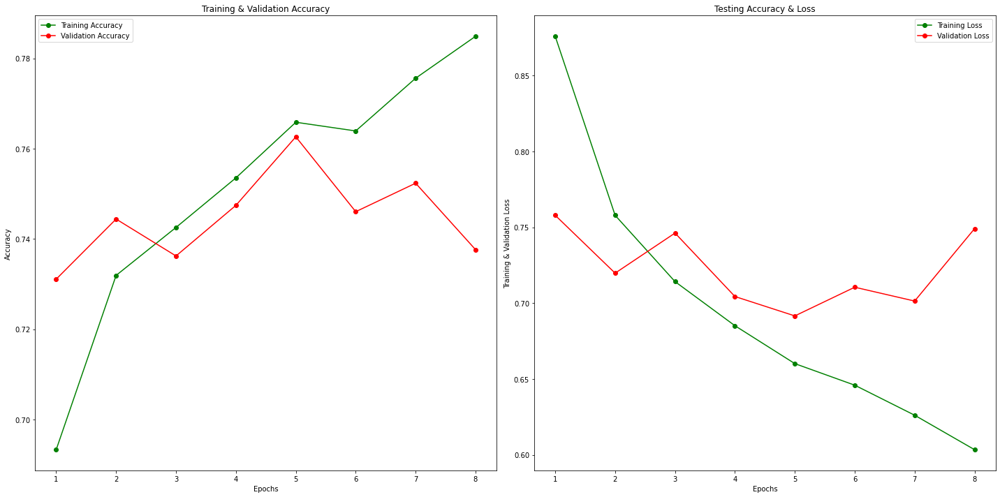

Model computation time: 0:51:57.701487
-------------------------
1-fold training
-------------------------
Found 17117 validated image filenames belonging to 5 classes.
Found 4280 validated image filenames belonging to 5 classes.
Epoch 1/10
535/535 [==============================] - 323s 604ms/step - loss: 0.6724 - accuracy: 0.7566 - val_loss: 0.6806 - val_accuracy: 0.7776 - lr: 0.0010
Epoch 2/10
535/535 [==============================] - 413s 773ms/step - loss: 0.6453 - accuracy: 0.7691 - val_loss: 0.5849 - val_accuracy: 0.7911 - lr: 0.0010
Epoch 3/10
535/535 [==============================] - 318s 594ms/step - loss: 0.6279 - accuracy: 0.7727 - val_loss: 0.5868 - val_accuracy: 0.7874 - lr: 0.0010
Epoch 4/10
535/535 [==============================] - 362s 675ms/step - loss: 0.6077 - accuracy: 0.7795 - val_loss: 0.6373 - val_accuracy: 0.7647 - lr: 0.0010
Epoch 5/10
535/535 [==============================] - 422s 788ms/step - loss: 0.5941 - accuracy: 0.7844 - val_loss: 0.5898 - val_accur

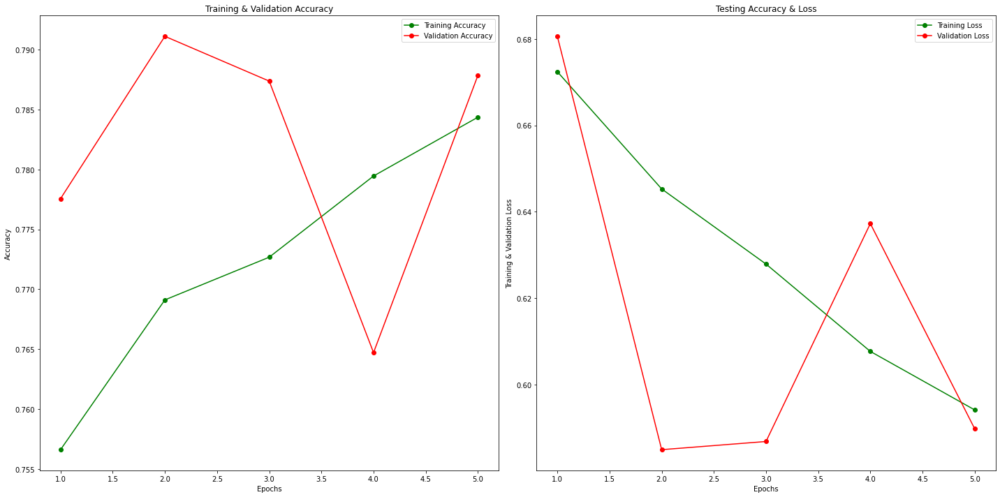

Model computation time: 0:30:41.300906
-------------------------
2-fold training
-------------------------
Found 17118 validated image filenames belonging to 5 classes.
Found 4279 validated image filenames belonging to 5 classes.
Epoch 1/10
535/535 [==============================] - 299s 558ms/step - loss: 0.6332 - accuracy: 0.7725 - val_loss: 0.5976 - val_accuracy: 0.7859 - lr: 0.0010
Epoch 2/10
319/535 [================>.............] - ETA: 2:18 - loss: 0.6135 - accuracy: 0.7798

KeyboardInterrupt: 

In [28]:
resnet_oof_acc=[]
resnet_oof_val_acc=[]
resnet_oof_loss=[]
resnet_oof_val_loss=[]
resnet_model_time = []

for i in range(5):
    
    t1_1 = datetime.now()
    
    print(25*"-")    
    print(f'{i}-fold training')
    print(25*"-")

    resnet_model, history, train_generator, validation_generator = train_model(df_train, 32, 224, 224, i, resnet_model)

    train_accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']

    resnet_oof_acc.append(train_accuracy)
    resnet_oof_val_acc.append(val_accuracy)
    resnet_oof_loss.append(train_loss)
    resnet_oof_val_loss.append(val_loss)


    epochs = range(1, len(train_accuracy) + 1)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    fig.set_size_inches(20,10)

    ax1.plot(epochs , train_accuracy , 'go-' , label = 'Training Accuracy')
    ax1.plot(epochs , val_accuracy , 'ro-' , label = 'Validation Accuracy')
    ax1.set_title('Training & Validation Accuracy')
    ax1.legend()
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel("Accuracy")

    ax2.plot(epochs , train_loss , 'g-o' , label = 'Training Loss')
    ax2.plot(epochs , val_loss , 'r-o' , label = 'Validation Loss')
    ax2.set_title('Testing Accuracy & Loss')
    ax2.legend()
    ax2.set_xlabel("Epochs")
    ax2.set_ylabel("Training & Validation Loss")

    fig.tight_layout()
    plt.show()
    
    t2_1 = datetime.now()
    resnet_model_time.append(str(t2_1 - t1_1))
    print("Model computation time: " + str(t2_1 - t1_1))

In [104]:
resnet_acc_average = [sum(sub_list) / len(sub_list) for sub_list in resnet_oof_acc]
resnet_val_acc_average = [sum(sub_list) / len(sub_list) for sub_list in resnet_oof_val_acc]
resnet_loss_average = [sum(sub_list) / len(sub_list) for sub_list in resnet_oof_loss]
resnet_val_loss_average = [sum(sub_list) / len(sub_list) for sub_list in resnet_oof_val_loss]

In [105]:
print("Average training accuracy across 5 folds with ten epochs each -", resnet_acc_average)
print("Average validation accuracy across 5 folds with ten epochs each -", resnet_val_acc_average)
print("Average training loss across 5 folds with ten epochs each -", resnet_loss_average)
print("Average validation loss across 5 folds with ten epochs each -", resnet_val_loss_average)

Average training accuracy across 5 folds with ten epochs each - [0.7597476243972778, 0.7965531349182129, 0.8002687096595764, 0.8127701878547668, 0.8227830410003663]
Average validation accuracy across 5 folds with ten epochs each - [0.7349532723426819, 0.7978037476539612, 0.8087754249572754, 0.7996319159865379, 0.822855806350708]
Average training loss across 5 folds with ten epochs each - [0.6709846913814544, 0.5690608143806457, 0.5560932904481888, 0.5216111578047276, 0.49283947944641116]
Average validation loss across 5 folds with ten epochs each - [0.739363718032837, 0.5634576082229614, 0.5378054976463318, 0.568477563560009, 0.4992532730102539]


In [106]:
resnet_model_time

['0:44:23.612612',
 '0:25:49.166812',
 '0:23:53.742438',
 '0:43:03.921404',
 '0:26:20.290607']

In [107]:
print("KFold Validation Accuracy: ", np.hstack(resnet_oof_acc).mean())

KFold Validation Accuracy:  0.7936685457825661


In [108]:
Y_pred = resnet_model.predict_generator(validation_generator)
y_pred = np.argmax(Y_pred, axis=1)
print('Classification Report')
target_names = list(train_generator.class_indices.keys()) # Classes
print(classification_report(validation_generator.classes, y_pred, target_names=target_names))

Classification Report
              precision    recall  f1-score   support

           0       0.84      0.51      0.64       218
           1       0.83      0.63      0.71       437
           2       0.80      0.54      0.65       477
           3       0.91      0.96      0.93      2631
           4       0.57      0.80      0.67       516

    accuracy                           0.83      4279
   macro avg       0.79      0.69      0.72      4279
weighted avg       0.84      0.83      0.83      4279



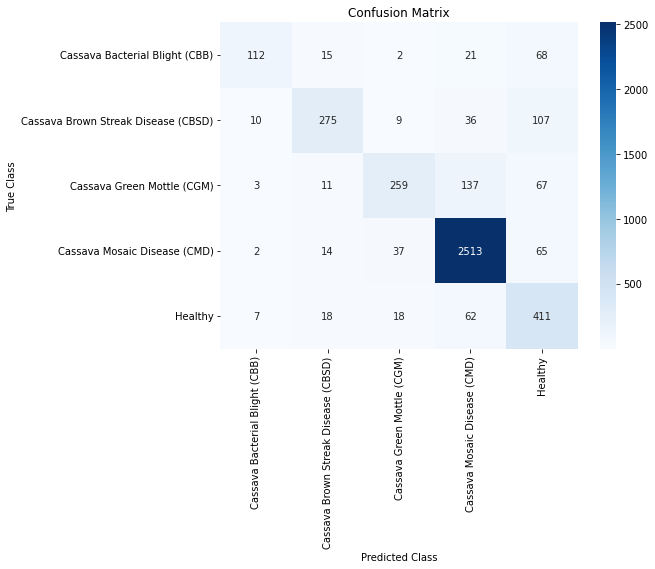

In [109]:
cm = confusion_matrix(validation_generator.classes, y_pred)
labels = ['Cassava Bacterial Blight (CBB)', 'Cassava Brown Streak Disease (CBSD)', 'Cassava Green Mottle (CGM)', 'Cassava Mosaic Disease (CMD)','Healthy']
plt.figure(figsize=(8,6))
sns.heatmap(cm,xticklabels=labels, yticklabels=labels, annot=True, fmt='d', cmap="Blues", vmin = 0.2);
plt.title('Confusion Matrix')
plt.ylabel('True Class')
plt.xlabel('Predicted Class')
plt.show()

In [110]:
pred = pd.DataFrame(y_pred, columns=['class_pred'])
pred['pred'] = pred['class_pred'].map({int(i) : c for i, c in disease_class.items()})

In [111]:
validation = df_train[df_train.kfold == 4].reset_index(drop=True)

image_ids_test = validation["image_id"].values
labels_test = validation["class"].values
pred_result = pred['pred'].values

In [112]:
rand_idxs = np.random.permutation(len(validation))[:9]

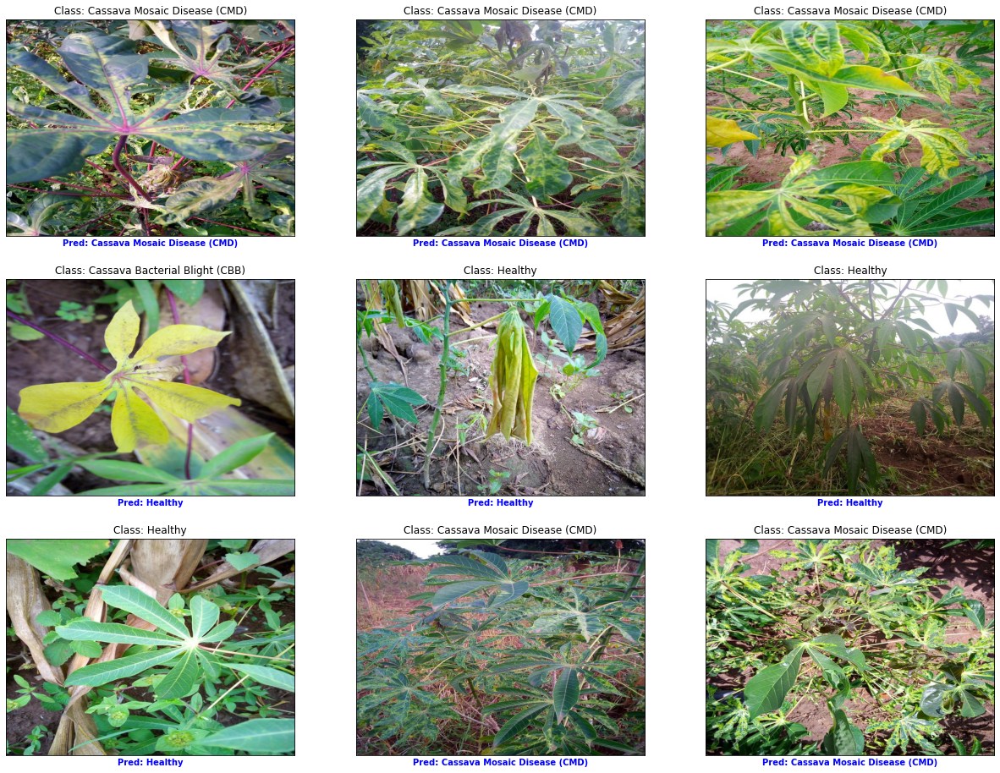

In [113]:
plot(image_ids_test[rand_idxs], labels_test[rand_idxs], pred_result[rand_idxs])
plt.show()

### Model Prediction

In [4]:
sample = pd.read_csv("../cassava-leaf-disease-classification/sample_submission.csv")
sample

,image_id,label
0,2216849948.jpg,4


In [ ]:
preds = []

for image in sample.image_id:
    img = tf.keras.preprocessing.image.load_img('../cassava-leaf-disease-classification/test_images/' + image)
    img = tf.keras.preprocessing.image.img_to_array(img)
    img = tf.keras.preprocessing.image.smart_resize(img, (224, 224))
    img = tf.reshape(img, (-1, 224, 224, 3))
    prediction = resnet_model.predict(img/255)
    preds.append(np.argmax(prediction))

submission = pd.DataFrame({'image_id': sample.image_id, 'label': preds})
submission.to_csv('submission.csv', index=False) 